In [1]:
import pandas as pd
from ydata_profiling import ProfileReport

Pandas backend NOT loaded
Numpy backend NOT loaded
Pyspark backend NOT loaded
Python backend loaded


In [2]:
df_listing_sep = pd.read_csv('listings_sept.csv')
df_listing_jun = pd.read_csv('listings_jun.csv')
# df_listing_mar = pd.read_csv('listings_sum_march.csv')

df_rev_sep = pd.read_csv('reviews_sept.csv')
df_rev_jun = pd.read_csv('reviews_jun.csv')
# df_rev_mar = pd.read_csv('reviews_march.csv')

In [145]:
pd.to_datetime(df_listing_sep.last_review).max()

Timestamp('2024-09-13 00:00:00')

In [4]:
df_rev_jun.head()

,listing_id,date
0,3109,2017-10-28
1,3109,2017-11-03
2,3109,2018-07-24
3,3109,2019-10-24
4,5396,2009-06-30


In [38]:
#  compare dataset
jun_cols = ['id', 'room_type','price', 'number_of_reviews', 'last_review','neighbourhood', 
            'minimum_nights', 'calculated_host_listings_count', 'availability_365', 'license',
            'latitude', 'longitude']

df_combine = df_listing_jun[jun_cols].merge(df_listing_sep[['id', 'price', 'number_of_reviews', 'last_review','minimum_nights', 'availability_365']], 
                                                           how='inner', on='id',
                                                           suffixes = ("_jun","_sep"))

In [63]:
import numpy as np

df_combine['diff_price'] = df_combine['price_sep'] - df_combine['price_jun']
df_combine['diff_review'] = df_combine['number_of_reviews_sep'] - df_combine['number_of_reviews_jun']
df_combine['diff_minimum_nights'] = df_combine['minimum_nights_sep'] - df_combine['minimum_nights_jun']
df_combine['price_ratio'] = np.round(df_combine['price_sep'] / df_combine['price_jun'],2)
df_combine['diff_availability'] = df_combine['availability_365_sep'] - df_combine['availability_365_jun']
df_combine['price_ratio'] = np.round(df_combine['price_sep'] / df_combine['price_jun'], 2)
df_combine['price_change_pct'] = np.round(df_combine['diff_price'] *100.00 / df_combine['price_jun'], 2)
df_combine['have_license'] = df_combine['license'].isna()

In [7]:
profile_listing = ProfileReport(df_combine)
profile_listing

Render HTML: 100%|██████████| 1/1 [00:06<00:00,  6.92s/it]


In [70]:
[df_combine['price_change_pct'].min(), df_combine['price_change_pct'].quantile(.99), df_combine['price_change_pct'].max()]

[-99.79, 110.0, 9682.61]

In [73]:
df_combine[df_combine['price_change_pct'] > 400]

,id,room_type,price_jun,number_of_reviews_jun,last_review_jun,neighbourhood,minimum_nights_jun,calculated_host_listings_count,availability_365_jun,license,...,last_review_sep,minimum_nights_sep,availability_365_sep,diff_price,diff_review,diff_minimum_nights,price_ratio,diff_availability,price_change_pct,have_license
676,1168450364481609527,Entire home/apt,685.0,0,NaN,Popincourt,1,1,82,7511112814571,...,NaN,1,113,9314.0,0,0,14.60,31,1359.71,False
3354,1034048620852765561,Entire home/apt,271.0,0,NaN,Louvre,2,170,35,7510109873569,...,2024-08-31,1,42,1406.0,2,-1,6.19,7,518.82,False
4305,1099859388340332217,Entire home/apt,258.0,1,2024-05-20,Luxembourg,3,77,82,7510611018329,...,2024-05-20,3,0,1910.0,0,0,8.40,-82,740.31,False
5751,11094606,Entire home/apt,111.0,70,2024-04-20,Batignolles-Monceau,3,426,43,7511700298536,...,2024-08-30,3,13,558.0,4,0,6.03,-30,502.70,False
6958,818531802766224362,Entire home/apt,189.0,1,2023-06-24,Opéra,30,5,309,"Available with a mobility lease only (""bail mo...",...,2023-06-24,30,293,1764.0,0,0,10.33,-16,933.33,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82700,24392125,Entire home/apt,40.0,36,2021-01-17,Popincourt,1,2,2,7511102993223,...,2021-01-17,1,1,410.0,-1,0,11.25,-1,1025.00,False
83459,40194653,Shared room,65.0,538,2024-05-17,Reuilly,1,10,202,NaN,...,2024-08-21,1,250,421.0,6,0,7.48,48,647.69,True
84140,1092665870816247945,Entire home/apt,271.0,0,NaN,Panthéon,2,170,33,7510511168311,...,NaN,1,0,1458.0,0,-1,6.38,-33,538.01,False
84655,1030402793852505566,Entire home/apt,100.0,5,2024-05-20,Vaugirard,2,1,120,7511510571979,...,2024-07-15,2,153,700.0,2,0,8.00,33,700.00,False


In [37]:
df_combine[['room_type', 'price_change_pct']].groupby('room_type').aggregate([lambda x:x.quantile(.25),
                                                                              lambda x:x.quantile(.5),
                                                                              lambda x:x.quantile(.75)
                                                                              ])

price_change_pct                      
                      <lambda_0> <lambda_1> <lambda_2>
room_type                                             
Entire home/apt            -9.09      0.000      1.650
Hotel room                 -4.50      3.445     13.115
Private room               -4.46      0.000      6.710
Shared room                -2.22      0.000     10.810

In [97]:
df_combine[['have_license', 'price_change_pct']].groupby('have_license').aggregate([lambda x:x.quantile(.25),
                                                                              lambda x:x.quantile(.5),
                                                                              lambda x:x.quantile(.75)
                                                                              ])

price_change_pct                      
                   <lambda_0> <lambda_1> <lambda_2>
have_license                                       
False                   -9.52        0.0       2.26
True                    -1.79        0.0       4.65

In [100]:
[len(df_combine), len(df_combine[df_combine['price_change_pct'] >= 0]), len(df_combine[df_combine['price_change_pct'] < 0])]

[85579, 34913, 19193]

(array([  162.,   658.,  2068.,  6549., 32780.,  7671.,  2221.,   856.,
          363.,   235.]),
 array([-99.79 , -78.825, -57.86 , -36.895, -15.93 ,   5.035,  26.   ,
         46.965,  67.93 ,  88.895, 109.86 ]),
 <BarContainer object of 10 artists>)

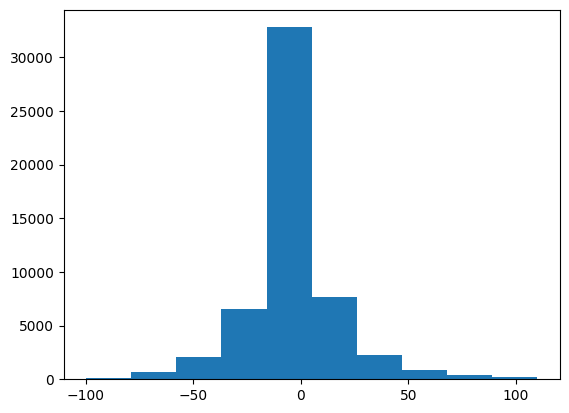

In [109]:
plt.hist(df_combine[(df_combine['price_change_pct'] >= -400) & (df_combine['price_change_pct'] < 110)]['price_change_pct'] )

In [42]:
# lat long checking
agg_neig = df_combine[['neighbourhood','latitude', 'longitude','id']].groupby(['neighbourhood']).aggregate({'latitude':['min','max'],
                                                                                                'longitude':['min','max'],
                                                                                                'id':['nunique']}  ).reset_index()

In [43]:
agg_neig.columns

MultiIndex([('neighbourhood',        ''),
            (     'latitude',     'min'),
            (     'latitude',     'max'),
            (    'longitude',     'min'),
            (    'longitude',     'max'),
            (           'id', 'nunique')],
           )

In [54]:
agg_neig.columns = ['neighbourhood', 'lat_min', 'lat_max', 'long_min', 'long_max', 'total_hosting']

In [55]:
agg_neig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   neighbourhood  20 non-null     object 
 1   lat_min        20 non-null     float64
 2   lat_max        20 non-null     float64
 3   long_min       20 non-null     float64
 4   long_max       20 non-null     float64
 5   total_hosting  20 non-null     int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.1+ KB


In [59]:
agg_neig['diff_lat'] = agg_neig['lat_max'] - agg_neig['lat_min']
agg_neig['diff_long'] = agg_neig['long_max'] - agg_neig['long_min']

agg_neig

,neighbourhood,lat_min,lat_max,long_min,long_max,total_hosting,diff_lat,diff_long
0,Batignolles-Monceau,48.873968,48.900944,2.280073,2.329820,5988,0.026976,0.049748
1,Bourse,48.863562,48.871880,2.328750,2.354160,2779,0.008318,0.025410
2,Buttes-Chaumont,48.872227,48.901670,2.365120,2.410180,4897,0.029443,0.045060
3,Buttes-Montmartre,48.882110,48.901197,2.325730,2.370784,9543,0.019087,0.045054
4,Entrepôt,48.867840,48.884400,2.347900,2.376669,5871,0.016560,0.028769
5,Gobelins,48.816090,48.842230,2.341437,2.388890,2902,0.026140,0.047453
6,Hôtel-de-Ville,48.847330,48.861853,2.345180,2.369050,2550,0.014523,0.023870
7,Louvre,48.855355,48.869660,2.321580,2.350905,1837,0.014305,0.029325
8,Luxembourg,48.840354,48.858410,2.317320,2.344076,2441,0.018056,0.026756
9,Ménilmontant,48.846720,48.877698,2.377200,2.416250,4739,0.030978,0.039050


In [118]:
(df_combine['latitude']).astype('float')

0        48.889930
1        48.852160
2        48.831000
3        48.848980
4        48.849199
           ...    
85574    48.850558
85575    48.849240
85576    48.849160
85577    48.882538
85578    48.886530
Name: latitude, Length: 85579, dtype: float64

In [137]:
# binning trial

bin = 11
lat_bins = []
lat_label = []
delta_lat = (df_combine['latitude'].max() - df_combine['latitude'].min())/(bin - 1)

for i in range(bin):
    lat_bins.append(df_combine['latitude'].min() + i*delta_lat)
    if i == bin-1:
        None
    else:
        lat_label.append(i)

# Apply binning with custom labels
df_combine['bin_latitude'] = pd.cut((df_combine['latitude']).astype('float'), bins=lat_bins, labels=lat_label)

# Show the binned data
# print(binned_data)

long_bins = []
long_label = []
delta_long = (df_combine['longitude'].max() - df_combine['longitude'].min())/(bin - 1)

for i in range(bin):
    long_bins.append(df_combine['longitude'].min() + i*delta_lat)
    if i == bin-1:
        None
    else:
        long_label.append(i)

# Apply binning with custom labels
df_combine['bin_longitude'] = pd.cut((df_combine['longitude']).astype('float'), bins=long_bins, labels=long_label)

# Show the binned data
# print(binned_data)

In [139]:
price_bin = df_combine[['bin_latitude', 'bin_longitude', 'price_change_pct']].groupby(['bin_latitude', 'bin_longitude']).median().reset_index()

In [146]:
price_bin.to_csv('price_by_bin.csv', index=False)

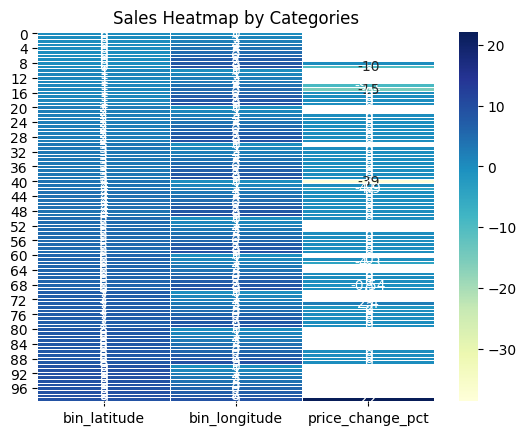

In [141]:
# pivot_df = price_bin.pivot('bin_latitude', 'bin_longitude', 'price_change_pct')

# Create the heatmap
sb.heatmap(price_bin, annot=True, cmap='YlGnBu', linewidths=0.5)

# Display the heatmap
plt.title("Sales Heatmap by Categories")
plt.show()

In [121]:
lat_label

[0, 1, 2, 3, 4]

## clustering

In [74]:
df_cluster = df_combine[(df_combine.price_jun.notna()) & (df_combine.price_sep.notna()) & (df_combine['price_change_pct']<=400)].copy()

In [75]:
df_cluster[['neighbourhood', 'room_type','price_change_pct']].groupby(['neighbourhood', 'room_type']).quantile(.5).reset_index().to_csv('price_change_per_neigh.csv', index = False)

In [76]:
df_cluster[df_cluster.price_ratio.isna()]

,id,room_type,price_jun,number_of_reviews_jun,last_review_jun,neighbourhood,minimum_nights_jun,calculated_host_listings_count,availability_365_jun,license,...,last_review_sep,minimum_nights_sep,availability_365_sep,diff_price,diff_review,diff_minimum_nights,price_ratio,diff_availability,price_change_pct,have_license


In [77]:
df_cluster.columns

Index(['id', 'room_type', 'price_jun', 'number_of_reviews_jun',
       'last_review_jun', 'neighbourhood', 'minimum_nights_jun',
       'calculated_host_listings_count', 'availability_365_jun', 'license',
       'latitude', 'longitude', 'price_sep', 'number_of_reviews_sep',
       'last_review_sep', 'minimum_nights_sep', 'availability_365_sep',
       'diff_price', 'diff_review', 'diff_minimum_nights', 'price_ratio',
       'diff_availability', 'price_change_pct', 'have_license'],
      dtype='object')

In [78]:
# df_cluster_filt = df_cluster[['id','room_type', 'neighbourhood', 'diff_price', 'price_ratio']].copy().reset_index().drop(columns='index')
df_cluster_filt = df_cluster[['id','room_type', 'neighbourhood', 'price_change_pct']].copy().reset_index().drop(columns='index')

In [79]:
# df_listings_filt_enc = pd.get_dummies(df_listings_filt, columns=['neighbourhood', 'room_type'], drop_first=True)

from sklearn.preprocessing import OneHotEncoder

encoder_neig = OneHotEncoder(sparse=False, drop='first')
encoded_neig = encoder_neig.fit_transform(df_cluster_filt[['neighbourhood']])
df_neig_encoded = pd.DataFrame(encoded_neig, columns=encoder_neig.get_feature_names_out(['neighbourhood']))

encoder_room = OneHotEncoder(sparse=False, drop='first')
encoded_room = encoder_room.fit_transform(df_cluster_filt[['room_type']])
df_room_encoded = pd.DataFrame(encoded_room, columns=encoder_room.get_feature_names_out(['room_type']))

In [80]:
# cluster_cols = []

# df_listings_filt.join(encoded)
df_cluster_enc = pd.concat([df_cluster_filt.drop(columns=['neighbourhood']), df_neig_encoded], axis=1)
df_cluster_enc = pd.concat([df_cluster_enc.drop(columns=['room_type']), df_room_encoded], axis=1)
# df_cluster_enc = df_cluster_enc.drop(columns=['id', 'license', 'last_review_jun', 'last_review_sep'])

In [81]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

inertia = []
# silhouette_scores = []

for k in range(1, 20):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_cluster_enc)
    inertia.append(kmeans.inertia_)

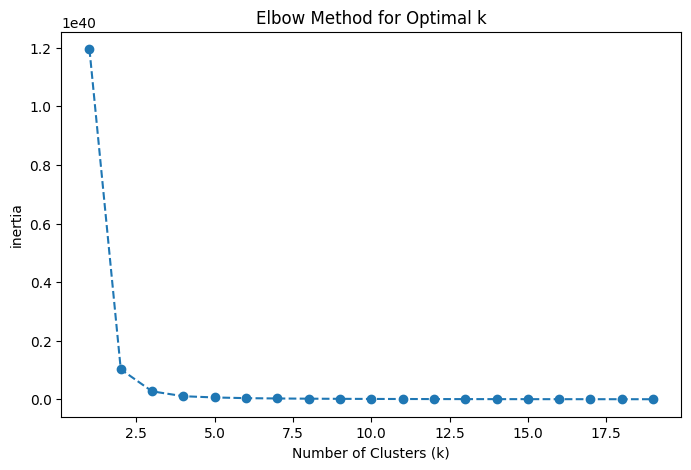

In [82]:
plt.figure(figsize=(8,5))
plt.plot(range(1, 20), inertia, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

In [83]:
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans.fit(df_cluster_enc)

# df_combine_filt = df_combine[(df_combine.price_jun.notna()) & (df_combine.price_sep.notna())].copy()
df_cluster_filt['cluster_group'] = kmeans.predict(df_cluster_enc)
# kmeans.predict(df_cluster_enc)

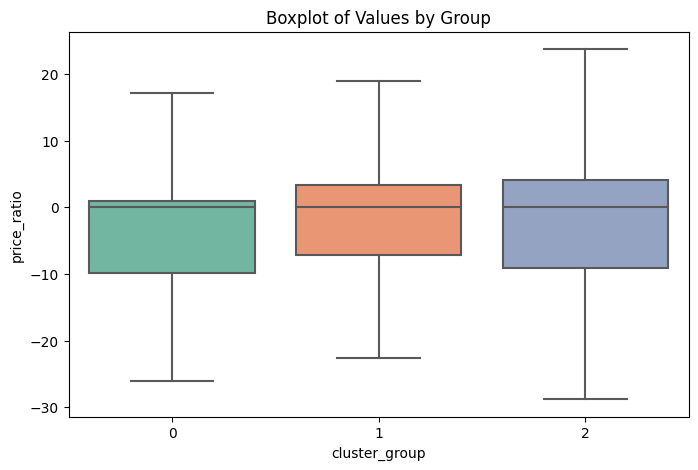

In [84]:
# Create a boxplot
import seaborn as sb

plt.figure(figsize=(8, 5))
sb.boxplot(x='cluster_group', y='price_change_pct', data=df_cluster_filt, palette="Set2", showfliers = False)
plt.xlabel("cluster_group")
plt.ylabel("price_ratio")
plt.title("Boxplot of Values by Group")
plt.show()

In [85]:
df_cluster_filt[['cluster_group', 'price_change_pct']].groupby(['cluster_group']).aggregate([lambda x : x.quantile(.25),
                                                                                    'median', 'mean',
                                                                                    lambda x : x.quantile(.75)
                                                                                    ])

price_change_pct                            
                    <lambda_0> median      mean <lambda_1>
cluster_group                                             
0                       -9.910    0.0 -0.898039       0.92
1                       -7.105    0.0  0.602443       3.30
2                       -9.090    0.0 -0.022319       4.05

In [17]:
df_cluster_filt[df_cluster_filt.cluster_group==0]['price_change_pct'].describe()

count    25754.000000
mean         1.168212
std         91.336896
min        -99.020000
25%         -9.857500
50%          0.000000
75%          1.010000
max       8303.360000
Name: price_change_pct, dtype: float64

In [18]:
df_cluster_filt[df_cluster_filt.cluster_group==1]['price_change_pct'].describe()

count    16943.000000
mean         1.864003
std         40.758049
min        -99.720000
25%         -7.040000
50%          0.000000
75%          3.360000
max       1086.000000
Name: price_change_pct, dtype: float64

In [19]:
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the data
scaled_data = scaler.fit_transform(df_cluster_enc)

# Convert the result back to a DataFrame (optional)
scaled_df = pd.DataFrame(scaled_data, columns=df_cluster_enc.columns)

In [20]:
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans.fit(scaled_df)

df_cluster_filt_two = df_cluster_filt.drop(columns='cluster_group').copy()

# df_combine_filt = df_combine[(df_combine.price_jun.notna()) & (df_combine.price_sep.notna())].copy()
df_cluster_filt_two['cluster_group'] = kmeans.predict(scaled_data)
# kmeans.predict(df_cluster_enc)

c:\Users\User\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


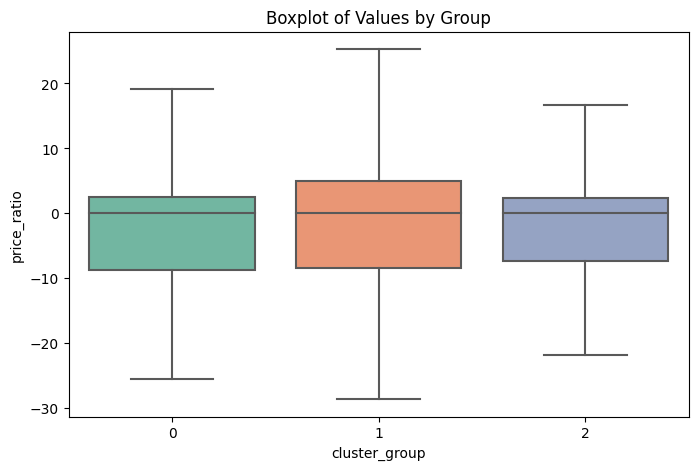

In [21]:
# Create a boxplot
import seaborn as sb

plt.figure(figsize=(8, 5))
sb.boxplot(x='cluster_group', y='price_change_pct', data=df_cluster_filt_two, palette="Set2", showfliers = False)
plt.xlabel("cluster_group")
plt.ylabel("price_ratio")
plt.title("Boxplot of Values by Group")
plt.show()

In [34]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=.7, min_samples=2500)  # eps is the maximum distance between two samples, min_samples is the minimum number of samples to form a cluster

df_cluster_filt_three = df_cluster_filt.drop(columns='cluster_group').copy()

df_cluster_filt_three['cluster_group'] = dbscan.fit_predict(scaled_df)


In [35]:
df_cluster_filt_three.describe()

,id,price_change_pct,cluster_group
count,5.410600e+04,54106.000000,54106.000000
mean,6.660348e+17,1.510730,-0.474901
std,4.703170e+17,81.620388,1.126394
min,3.109000e+03,-99.790000,-1.000000
25%,4.547912e+07,-8.637500,-1.000000
50%,8.888166e+17,0.000000,-1.000000
75%,1.074522e+18,2.560000,-1.000000
max,1.176033e+18,9682.610000,3.000000


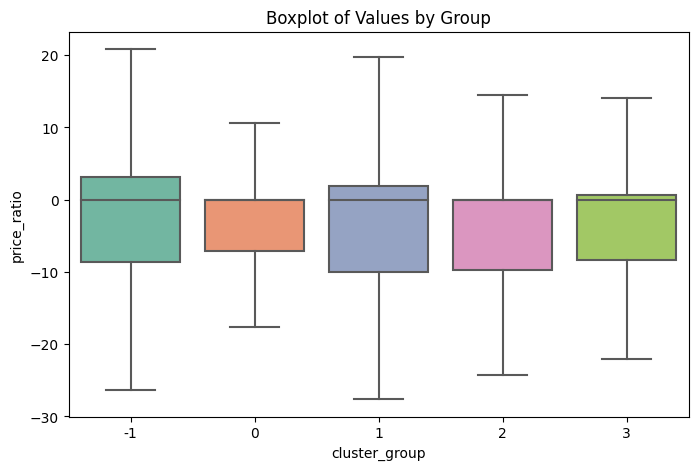

In [36]:
# Create a boxplot
import seaborn as sb

plt.figure(figsize=(8, 5))
sb.boxplot(x='cluster_group', y='price_change_pct', data=df_cluster_filt_three, palette="Set2", showfliers = False)
plt.xlabel("cluster_group")
plt.ylabel("price_ratio")
plt.title("Boxplot of Values by Group")
plt.show()

In [29]:
df_cluster_filt_three

,id,room_type,neighbourhood,price_change_pct,cluster_group
0,907334372443748916,Entire home/apt,Buttes-Montmartre,-55.00,0
1,748622699683505970,Entire home/apt,Buttes-Montmartre,0.00,0
2,39075508,Entire home/apt,Buttes-Montmartre,0.00,1
3,1143374758553613989,Entire home/apt,Buttes-Montmartre,135.29,0
4,1069561036062508081,Entire home/apt,Passy,0.00,2
...,...,...,...,...,...
54101,912885258503249249,Entire home/apt,Luxembourg,0.00,34
54102,1097772613643886884,Entire home/apt,Panthéon,-3.85,50
54103,16117980,Entire home/apt,Luxembourg,-40.16,36
54104,641029927221252082,Entire home/apt,Opéra,11.39,37


In [91]:
df_cluster_filt[df_cluster_filt.neighbourhood.isnull()]

,id,room_type,neighbourhood,price_change_pct,cluster_group


In [95]:
from sklearn.preprocessing import LabelEncoder

# encoder_neig = LabelEncoder()
# df_neig_encoded['neighbourhood_enc'] = encoder_neig.fit_transform(df_cluster_filt['neighbourhood'])
# df_neig_encoded = pd.DataFrame(encoded_neig, columns=encoder_neig.get_feature_names_out(['neighbourhood']))

encoder_room = LabelEncoder()
df_neig_encoded['room_type_enc'] = encoder_room.fit_transform(df_cluster_filt['room_type'])
# df_room_encoded = pd.DataFrame(encoded_room, columns=encoder_room.get_feature_names_out(['room_type']))

# df_neig_encoded = df_neig_encoded.drop(columns=['neighbourhood_enc', 'room_type_enc'])

# df_cluster_lenc = pd.concat([df_cluster_filt.drop(columns=['neighbourhood']), df_neig_encoded], axis=1)
# df_cluster_lenc = pd.concat([df_cluster_lenc.drop(columns=['room_type']), df_room_encoded], axis=1)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [93]:
df_cluster_filt['neighbourhood'].unique()

array(['Buttes-Montmartre', 'Passy', 'Gobelins', 'Popincourt',
       'Ménilmontant', 'Entrepôt', 'Bourse', 'Buttes-Chaumont',
       'Observatoire', 'Vaugirard', 'Palais-Bourbon', 'Élysée',
       'Batignolles-Monceau', 'Louvre', 'Opéra', 'Panthéon', 'Reuilly',
       'Hôtel-de-Ville', 'Luxembourg', 'Temple'], dtype=object)